In [1]:
# Importing libraries required
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from os import listdir

In [2]:
# Reading all the images
path = r'C:\Users\rammo\ML_winter\Project\combined1'

img_org = []
for images in os.listdir(path):
    if(images.endswith(".jpg") or images.endswith(".jpeg") or images.endswith(".png")):
        img_org.append(images)

In [3]:
print("Total Images: ", len(img_org))

Total Images:  270


In [4]:
persons = len(img_org)//15
print("No of persons: ", persons)

No of persons:  18


In [5]:
# for i in range(len(img_org)):
#     img_temp = cv2.imread("images/"+img_org[i])
#     print(img_temp.shape)

In [6]:
# Function to get the face only and crop it using haarcascade
def get_cropped_image(img_toCrop):
    beforeCrop_rgb = cv2.cvtColor(img_toCrop, cv2.COLOR_BGR2RGB)
    beforeCrop_gray = cv2.cvtColor(beforeCrop_rgb, cv2.COLOR_RGB2GRAY)
    
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    faces = face_cascade.detectMultiScale(beforeCrop_gray, 1.3, 5)

    for (x,y,w,h) in faces:
        cv2.rectangle(beforeCrop_rgb,(x,y),(x+w,y+h),(255,0,0),2)
        
#     plt.imshow(beforeCrop_rgb)
#     plt.show()
    face_cropped = beforeCrop_gray[y:y+h, x:x+w]
    resized_face_image = cv2.resize(face_cropped, (128, 128))
    # Data normalizing
    resized_face_image = resized_face_image.astype(np.float32)
#     resized_face_image = resized_face_image/255
    
    return resized_face_image

In [7]:
# Storing the cropped images in a list and converting it into numpy array
person_names = []
cropped_face_images = []
for i in range(len(img_org)):
#     print(i, img_org[i])
    if(i%15==0):
        person_names.append(img_org[i].split('.')[0][:-1])
    read_image = cv2.imread("combined1/" + img_org[i])
#     read_image = cv2.resize(read_image, (1024, 1024))
    image_temp = get_cropped_image(read_image)
    cropped_face_images.append(image_temp)
cropped_face_images = np.array(cropped_face_images)

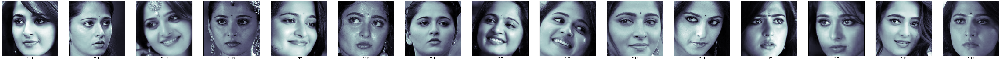

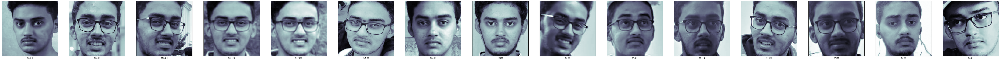

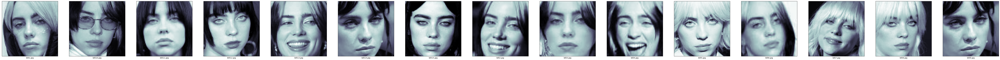

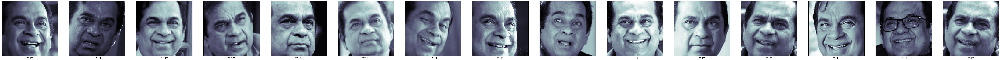

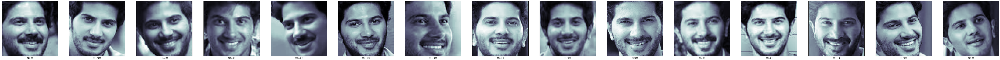

...

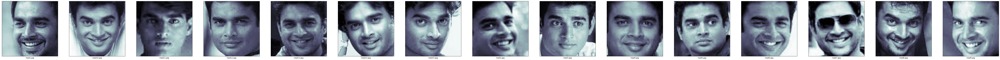

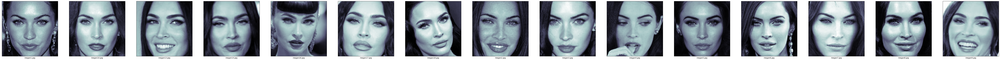

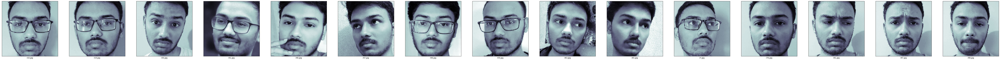

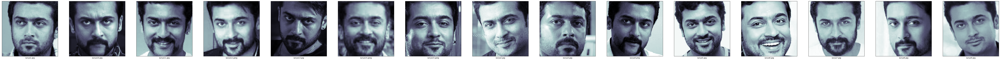

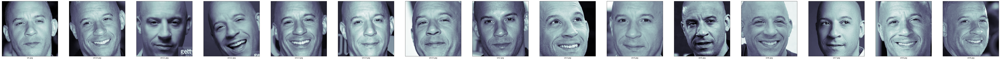

In [8]:
# Displaying the images of the cropped face
# fig = plt.figure(figsize=(100, 100))
# for i in range(75):
#     ax = fig.add_subplot(persons*3, 5, i + 1, xticks=[], yticks=[])
#     ax.imshow(cropped_face_images[i], cmap=plt.cm.bone)

count = 0 
for i in range(len(img_org)):
    if(count >= 15 or count == 0):
        count = 0
        fig = plt.figure(figsize=(100, 100))
    ax = fig.add_subplot(1, 15, count + 1, xlabel = str(img_org[i]),xticks=[],yticks=[])
    ax.imshow(cropped_face_images[i], cmap=plt.cm.bone)
    count += 1

In [9]:
# Shape describes: 1st=no of images, 2nd and 3rd=size of image
cropped_face_images.shape

(270, 128, 128)

In [10]:
# Reshaping images to get features of a single image in to a single array rather than 2d array

cropped_face_data = []

for i in range(len(cropped_face_images)):
    cropped_face_data.append(cropped_face_images[i].reshape(-1))

cropped_face_data = np.array(cropped_face_data)

# Shape represents: 1st=no of images, 2nd=total features for a corresponding image(128*128)
cropped_face_data.shape

(270, 16384)

In [11]:
from sklearn.model_selection import train_test_split

Y = []
for i in range(persons):
    Y.extend([i for j in range(15)])
Y = np.array(Y)
X_train, X_test, y_train, y_test = train_test_split(cropped_face_data, Y, test_size=0.3, random_state=0)

# For two people images(Me, Jyothish)
# For 0.5 Accuracy is 86.67
# For 0.3 Accuracy is 100

# For three people images(Me, Jyothish, Aravind)
# For 0.5 Accuracy is 73.79
# For 0.3 Accuracy is 71.42

# For 4 people images(Me, Jyothish, Aravind, MB)
# For 0.3 Accuracy is 77.77
# For 0.5 Accuracy is 73.77

# For 5 people (Me, Jyothish, Aravind, MB, BR)
# For 0.3 Accuracy is 52.17

# For 5 people (Me, Jyothish, Aravind, MB, Anushka)
# For 0.3 Accuracy is 60.86
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(189, 16384) (81, 16384) (189,) (81,)


In [12]:
Y

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  9,
        9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13,
       13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
       14, 14, 14, 14, 15

In [13]:
y_train

array([ 6, 14, 15, 16,  1, 15, 10,  1,  7,  5, 12, 14,  9,  7,  0, 10,  4,
        4,  3,  4,  1, 13, 14,  8, 16,  2,  0,  7, 15, 17,  0,  8,  1,  2,
       16, 10,  4,  3, 16, 10,  3,  1, 13, 14,  3, 14,  5,  3,  0, 15,  6,
       11,  5,  0, 10,  3,  2,  0,  3, 12,  8,  4, 10, 12,  8, 17, 10,  2,
       14,  9, 10, 11,  9,  7, 13,  6, 15,  6, 11,  2,  7,  0,  6,  6, 14,
        4,  3,  3,  5, 17,  9,  1, 16,  9,  5,  6,  8, 15, 17,  0,  4,  5,
       11,  8,  9, 17, 15, 15, 14,  6, 15, 16,  0,  7,  6,  2,  3, 11,  4,
        0,  8, 14, 12,  2,  7,  8, 16,  1,  2,  8,  3, 10, 14,  8,  2,  1,
       12,  7, 13, 10, 10, 13,  2, 15,  8, 12, 16, 17,  2, 11,  9, 15,  9,
        1, 11, 14,  6,  5, 17, 11,  5, 13, 16, 13,  7,  9, 17,  4,  5,  1,
       11,  5, 17, 11, 17,  2, 12,  5,  4,  5, 16, 14,  0, 13, 16, 12,  7,
        3, 11])

In [14]:
np.unique(y_train, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 array([11, 10, 12, 12, 10, 12, 10, 10, 11,  9, 11, 11,  8,  8, 12, 11, 11,
        10], dtype=int64))

In [15]:
cropped_face_data[0].shape # 128*128

(16384,)

# Performing PCA

In [16]:
from sklearn import decomposition

# Trying to fit PCA without any criteria to see the eigenvalues
pca = decomposition.PCA()
pca.fit(X_train)
print(pca.components_.shape)

(189, 16384)


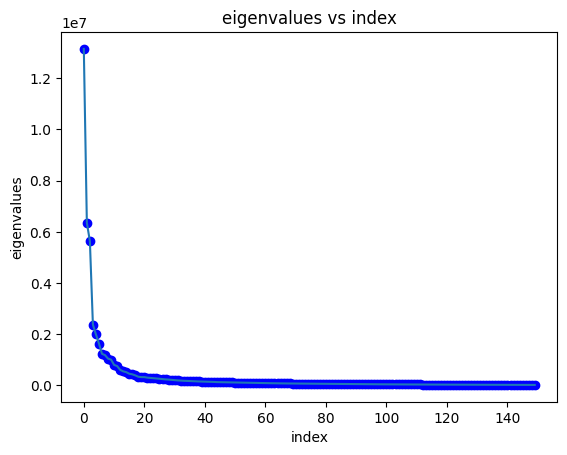

In [133]:
# Getting the eigenvalues
eigenValues = pca.explained_variance_
y = [i for i in range(len(eigenValues))]

# Displaying the eigenvalues to pick the top ones
plt.scatter(y, eigenValues, c='blue')
plt.plot(y, eigenValues)
plt.xlabel('index')
plt.ylabel('eigenvalues')
plt.title('eigenvalues vs index')
plt.show()

In [152]:
pca = decomposition.PCA(n_components=5, whiten=True)
pca.fit(X_train)

PCA(n_components=5, whiten=True)

In [153]:
print(pca.components_.shape)

(5, 16384)


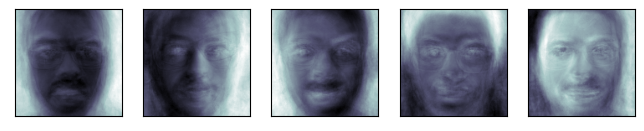

In [154]:
# The principal components measure deviations about this mean along orthogonal axes
fig = plt.figure(figsize=(8, 6))
for i in range(len(pca.components_)):
    ax = fig.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    ax.imshow(pca.components_[i].reshape(cropped_face_images[0].shape), cmap=plt.cm.bone)

In [138]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)
print(X_train_pca.shape)
print(X_test_pca.shape)

(189, 5)
(81, 5)


In [155]:
X_train_pca[i]

array([ 0.06314026,  1.2125394 , -0.01799132, -1.2086905 , -1.9561456 ],
      dtype=float32)

In [204]:
def pca_res(n_comp, k):
    from sklearn import decomposition
    pca = decomposition.PCA(n_components=n_comp,whiten=True)
    pca.fit(X_train)
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
#     print(X_train_pca.shape)
#     print(X_test_pca.shape)
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.metrics import accuracy_score

    clf = KNeighborsClassifier(k, weights='distance')
    clf.fit(X_train_pca,y_train)
    Y_pred = clf.predict(X_test_pca)
    res = accuracy_score(y_test, Y_pred)
    print(k,"KNN Accuracy: " + str(res))
    return res

In [151]:
n_comp_lis = [5, 7, 10, 15, 20, 30, 50, 100, 150]
ans = []
for i in n_comp_lis:
    print("No of components:", str(i) + ", ", end="")
    pca_res(i)

No of components: 5, 1KNN Accuracy: 0.30864197530864196
No of components: 7, 1KNN Accuracy: 0.37037037037037035
No of components: 10, 1KNN Accuracy: 0.3950617283950617
No of components: 15, 1KNN Accuracy: 0.43209876543209874
No of components: 20, 1KNN Accuracy: 0.49382716049382713
No of components: 30, 1KNN Accuracy: 0.4567901234567901
No of components: 50, 1KNN Accuracy: 0.48148148148148145
No of components: 100, 1KNN Accuracy: 0.4074074074074074
No of components: 150, 1KNN Accuracy: 0.2839506172839506


# Do KNN

In [199]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

clf = KNeighborsClassifier(1)

clf.fit(X_train_pca, y_train)

KNeighborsClassifier(n_neighbors=1)

In [200]:
Y_pred = clf.predict(X_test_pca)

print("1KNN Accuracy: " + str(accuracy_score(y_test, Y_pred)))

1KNN Accuracy: 0.30864197530864196


In [205]:
knn_val = [1, 3, 5, 7, 9]

for i in knn_val:
    pca_res(5, i)

1 KNN Accuracy: 0.30864197530864196
3 KNN Accuracy: 0.32098765432098764
5 KNN Accuracy: 0.30864197530864196
7 KNN Accuracy: 0.30864197530864196
9 KNN Accuracy: 0.30864197530864196


In [ ]:
# 5 - 30.86
# 7 - 37
# 8 - 38.27
# 9 - 39
# 15 - 43.2
# 20 - 46.91
# 30 - 44.44
# 50 - 46.91
# 100 - 44.44
# 150 - 32.09

In [186]:
Y_pred

array([ 2, 12, 10,  4,  7,  2, 14,  5,  8, 10,  3, 11, 14, 12,  2, 11,  0,
        3,  3,  7, 11, 16,  0, 12, 16,  4, 17,  5, 12, 11,  0,  2, 15,  2,
       15, 15, 16, 10,  2, 11, 17, 15, 10, 15, 15, 14, 17, 13,  2, 15,  1,
        4,  7, 14,  2,  4, 16,  7, 14,  7,  4,  9,  6,  7, 13,  2,  4, 11,
       10, 11,  4,  3,  9,  6,  5,  6, 16, 14, 17,  6,  2])

In [187]:
y_test

array([ 4,  9, 10, 12, 16, 13,  9, 12, 17,  1, 16,  9,  8,  6,  0, 11,  3,
       13,  3, 17, 11,  3,  0,  5, 16,  5, 12,  9, 12,  6,  6,  4, 17, 14,
       15, 15,  6, 10, 14, 12,  7,  1, 10, 15, 15,  2, 12,  8,  1, 16, 12,
       13, 13,  9,  0,  1, 13,  7,  0, 13,  4, 11,  6,  7,  4,  2, 13, 11,
       10,  8,  7,  1,  9, 17,  5,  4,  7, 14, 17,  8,  2])

In [188]:
# Displaying the number of items under each class given to predict
np.unique(y_test, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 array([4, 5, 3, 3, 5, 3, 5, 5, 4, 6, 4, 4, 7, 7, 3, 4, 4, 5], dtype=int64))

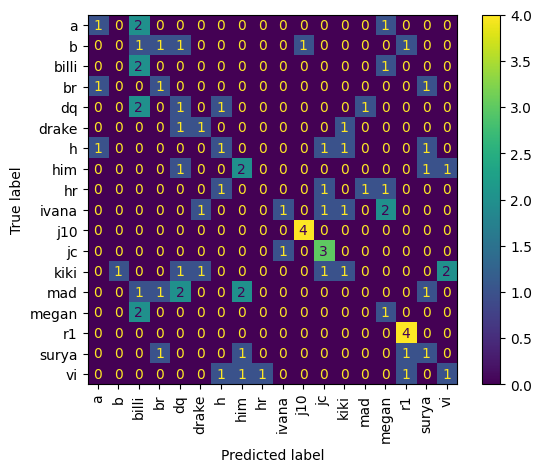

In [189]:
# Displaying the confusion matrix
from sklearn import metrics
from matplotlib import pyplot as plt

confusion_matrix = metrics.confusion_matrix(y_test, Y_pred)
cm_display = metrics.ConfusionMatrixDisplay.from_predictions(y_test, Y_pred, xticks_rotation='vertical', display_labels = person_names)

# fig, ax = plt.subplots(figsize=(5,5))

# cm_display.plot(ax = ax)
# plt.show()

In [29]:
# Obervations for images between very similar features
# Images with my brother is giving wrong prediction with 1 KNN classsifier.
# For 1KNN accuracy is 71.42
# For 3,5KNN accuracy is 78.57
# For 7KNN accuracy is 92.85
# For 9KNN it again dropped to 78.57

In [30]:
# I took random state 10. Got 80 accuracy for 5 people(Me, Jyothish, Ar, MB, AN)

# Logistic Regression

In [196]:
from sklearn.linear_model import LogisticRegression

logr_model = LogisticRegression()

In [197]:
logr_model.fit(X_train_pca, y_train)

LogisticRegression()

In [198]:
Y_pred_logr = logr_model.predict(X_test_pca)

print("Logistic Regression Accuracy: " + str(accuracy_score(y_test, Y_pred_logr)))

Logistic Regression Accuracy: 0.2716049382716049


In [34]:
Y_pred_logr

array([ 4,  9, 10,  0, 15,  8,  9,  1, 17, 15, 17,  4,  8,  8,  2, 11,  3,
        4,  3, 17, 11, 11,  9,  5, 16,  2, 12,  4,  8,  6, 14,  0, 17,  0,
       15, 15, 17, 10, 14, 12,  7,  1, 10, 15, 15,  2, 12,  8,  8, 15, 12,
        1, 13,  9,  0, 16, 13,  7,  0, 13, 13, 11, 14,  7,  4,  2, 13, 17,
       10,  3,  7,  1,  0,  8,  5,  4,  1, 14, 17,  8,  0])

In [35]:
y_test

array([ 4,  9, 10, 12, 16, 13,  9, 12, 17,  1, 16,  9,  8,  6,  0, 11,  3,
       13,  3, 17, 11,  3,  0,  5, 16,  5, 12,  9, 12,  6,  6,  4, 17, 14,
       15, 15,  6, 10, 14, 12,  7,  1, 10, 15, 15,  2, 12,  8,  1, 16, 12,
       13, 13,  9,  0,  1, 13,  7,  0, 13,  4, 11,  6,  7,  4,  2, 13, 11,
       10,  8,  7,  1,  9, 17,  5,  4,  7, 14, 17,  8,  2])

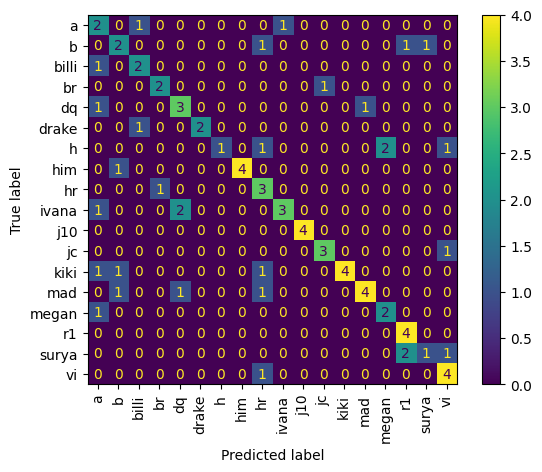

In [36]:
# Displaying the confusion matrix

cm_display1 = metrics.ConfusionMatrixDisplay.from_predictions(y_test, Y_pred_logr, xticks_rotation='vertical', \
                                                              display_labels = person_names)

In [37]:
# a = [[1, 2], [3, 4]]
# a = np.array(a)
# a.reshape(-1)

In [38]:
count = 0 
temp_fig = []
for i in range(len(img_org)):
    if(count >= 15 or count == 0):
        temp_fig.append(cropped_face_images[i])
        count = 0
    count += 1


In [39]:
len(temp_fig)

18

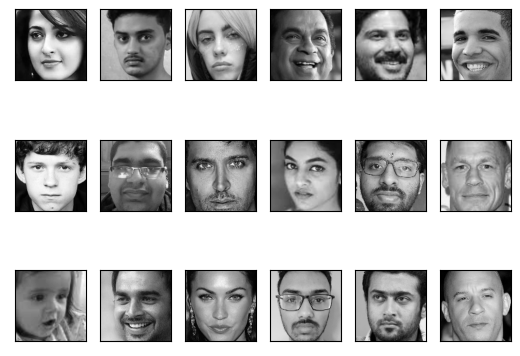

In [40]:
# fig = plt.figure(figsize=(100, 100))
# ax = fig.add_subplot(1, 15, count + 1, xlabel = str(img_org[i]),xticks=[],yticks=[])
# ax.imshow(cropped_face_images[i], cmap=plt.cm.bone)

for i in range(len(temp_fig)):
    plt.subplot(3, 6, i+1)
    plt.imshow(temp_fig[i], cmap='gray')
    plt.xticks([]),plt.yticks([])
    
plt.show()

In [41]:
a = 'a1.jpg'
# a = a.split('.')
b = a.split('.')[0][:-1]
b

'a'

In [42]:
from sklearn import datasets
faces = datasets.fetch_olivetti_faces()
faces.data.shape

(400, 4096)

In [43]:
faces.images.shape

(400, 64, 64)

In [44]:
faces.images[0]

array([[0.30991736, 0.3677686 , 0.41735536, ..., 0.37190083, 0.3305785 ,
        0.30578512],
       [0.3429752 , 0.40495867, 0.43801653, ..., 0.37190083, 0.338843  ,
        0.3140496 ],
       [0.3429752 , 0.41735536, 0.45041323, ..., 0.38016528, 0.338843  ,
        0.29752067],
       ...,
       [0.21487603, 0.20661157, 0.2231405 , ..., 0.15289256, 0.16528925,
        0.17355372],
       [0.20247933, 0.2107438 , 0.2107438 , ..., 0.14876033, 0.16115703,
        0.16528925],
       [0.20247933, 0.20661157, 0.20247933, ..., 0.15289256, 0.16115703,
        0.1570248 ]], dtype=float32)

In [45]:
faces.images[0]

array([[0.30991736, 0.3677686 , 0.41735536, ..., 0.37190083, 0.3305785 ,
        0.30578512],
       [0.3429752 , 0.40495867, 0.43801653, ..., 0.37190083, 0.338843  ,
        0.3140496 ],
       [0.3429752 , 0.41735536, 0.45041323, ..., 0.38016528, 0.338843  ,
        0.29752067],
       ...,
       [0.21487603, 0.20661157, 0.2231405 , ..., 0.15289256, 0.16528925,
        0.17355372],
       [0.20247933, 0.2107438 , 0.2107438 , ..., 0.14876033, 0.16115703,
        0.16528925],
       [0.20247933, 0.20661157, 0.20247933, ..., 0.15289256, 0.16115703,
        0.1570248 ]], dtype=float32)

In [46]:
faces.data[0]

array([0.30991736, 0.3677686 , 0.41735536, ..., 0.15289256, 0.16115703,
       0.1570248 ], dtype=float32)